In [1]:
import pandas as pd
import sys
import itertools
import os
import numpy as np
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns
from ppca import PPCA
from umap import UMAP


/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# I don't see a big difference on PCA or UMAP when keeping occurrence threshold at 0.5.. we might have most of the filtering in the low occurrence area so I am also trying to run it on 0 filtering (takes a bit longer) but this also means more imputation to even do the pca/umap. 
# In general I got to think that PCA/UMAP is not the best tool to see improvement in this. I will try some more correlations intead. Not sure it's so easy to say if it's better though. So it's also a decision to take. 
# Or do you have some ideas how we could check that it is better? some problematic specific batches batch effects to see if that is solved?

In [ ]:
# Try first correlation plots!!!
# Then we could also try silhouette scores

# ALSO PUSH CODE

# Idea for gs presentation.. if we decide to do this filter.. make scatter plot of # filtered data points vs intensity

# apart from that we want how much is filtered out (how does it translate to later - if done before some aggregation)
# how does correlations look after
# how does PCA look after

In [ ]:
# which options are there
# PP after summing across fractions + charge states
# PP before summing across fractions + charge states (not run yet)
# FP before protein grouping (running atm)
# FP after protein grouping (data is there but maybe wrong - find out)

In [2]:
# For PP after summing across fractions + charge states

# let's look at the z-scores also.. recalculate also robust z-scores on this and make a umap/ppca

results_folder = Path('/media/kusterlab/internal_projects/active/TOPAS/WP31/Playground/Retrospective_study/2025.08.14_CJ_paper_cohort_robust_zscore_and_dr_filter')
results_folder_original = Path('/media/kusterlab/internal_projects/active/TOPAS/WP31/Playground/Retrospective_study/2025.08.06_CJ_paper_cohort_topas_v7_corrected_metadata')

# phospho_measures_z.tsv
# we can also do for z-scores but then use from subfolder

# pp_after_summing = pd.read_csv(results_folder / 'preprocessed_pp.csv', index_col=['Modified sequence', 'Proteins', 'Gene names'])
# pp_original = pd.read_csv(results_folder_original / 'preprocessed_pp.csv', index_col=['Modified sequence', 'Proteins', 'Gene names'])

# try with z-scores
# pp_after_summing = pd.read_csv(results_folder / 'preprocessed_pp.csv', index_col=['Modified sequence', 'Proteins', 'Gene names'], nrows=10000)
# pp_original = pd.read_csv(results_folder_original / 'preprocessed_pp.csv', index_col=['Modified sequence', 'Proteins', 'Gene names'], nrows=10000)



# fp_before_grouping = pd.read_csv(results_folder / 'preprocessed_fp.csv', index_col='Gene names')
fp_after_grouping = pd.read_csv(results_folder / 'filter_at_protein_level' / 'preprocessed_fp.csv', index_col='Gene names')  
fp_original = pd.read_csv(results_folder_original / 'preprocessed_fp.csv', index_col='Gene names')

# Remove columns starting with Identification
# fp_before_grouping = fp_before_grouping.loc[:, ~fp_before_grouping.columns.str.startswith('Identification')]
fp_after_grouping = fp_after_grouping.loc[:, ~fp_after_grouping.columns.str.startswith('Identification')]
fp_original = fp_original.loc[:, ~fp_original.columns.str.startswith('Identification')]

pp_original = fp_original
pp_after_summing = fp_after_grouping


/tmp/ipykernel_634137/215711358.py:21: DtypeWarning: Columns (2688,2689,2690,2691,2692,2771,2772,2773,2774,2775,2776,2777,2778,2779,2780,2781,2782,2783,2804,2805,2806,2807,2808,2809,2810,2917,2918,2919,2986,2987,2988,2989,2990,2991,3024,3025,3026,3027,3028,3029,3100,3101,3102,3103,3104,3185,3186,3187,3188,3189,3190,3197,3198,3199,3200,3201,3202,3203,3204,3255,3256,3257,3258,3259,3260,3261,3356,3357,3358,3359,3360,3555,3556,3557,3558,3559,3560,3561,3562,3563,3564,3565,3598,3599,3600,3601,3602,3603,3604,3705,3706,3707,3708,3709,3710,3711,3712,3713,3723,3724,3725,3726,3727,3728,3729,3730,3731,3818,3819,3820,3821,3822,3823,3824,3825,3835,3836,3837,3838,3839,3840,3841,3862,3863,3864,3865,3866,3867,3868,3869,3992,3993,3994,3995,3996,3997,3998,3999,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4034,4035,4036,4037,4038,4039,4040,4041,4218,4219,4220,4221,4222,4223,4224,4225,4273,4274,4275,4276,4277,4278,4279,4297,4298,429

In [3]:
print(pp_after_summing.isna().sum().sum())
print(pp_original.isna().sum().sum())

12754617
12220168


In [4]:
sample_annotation = pd.read_csv(Path(results_folder) / "sample_annot_filtered.csv")
sample_annotation = sample_annotation.set_index('Sample name')

In [5]:

def filter_features_for_minimum_samples(
    df: pd.DataFrame, min_sample_occurrence_ratio: float = 0
) -> pd.DataFrame:
    # Transpose to samples x features
    df = df.transpose()
    print('before filter', df.shape)
    # Keep features present in >= min_sample_occurrence_ratio of samples
    df_filtered = df.loc[
        :, df.count(axis=0) >= df.shape[0] * min_sample_occurrence_ratio
    ]
    print('after filter', df_filtered.shape)
    return df_filtered

In [12]:
df = pp_after_summing
df = df.loc[:, ~df.columns.str.startswith('Identification')]
df = df.loc[:, ~df.columns.str.startswith('ref')]
df = filter_features_for_minimum_samples(df)
df.index = df.index.str.replace('pat_', '', regex=False)
df

before filter (1998, 13069)
after filter (1998, 13069)


Gene names,SYMPK,NUP160,FARP1,UPF1,IGBP1,PSMA1,COL6A2,TXLNA,POGLUT1,EFTUD2,...,LRRC2,ZP4,TRIML2,TBX19,DNAI3,CSF3R,MSANTD3,SLITRK3,MEIOC,SIGLEC14
I007-031-108742,8.18092,8.31544,8.38496,8.95921,8.12729,9.51380,10.33940,8.90282,8.06370,8.89626,...,NaN,NaN,NaN,NaN,8.57295,NaN,NaN,NaN,NaN,NaN
I043-005-95540,8.69479,8.77694,8.54319,9.05346,7.89114,9.33481,10.23270,8.55824,7.89021,9.47019,...,NaN,NaN,NaN,NaN,8.38353,NaN,NaN,NaN,NaN,NaN
I007-020-1007541,8.06539,8.28701,8.47106,8.94982,8.15998,9.51402,9.93953,8.69305,8.19263,8.97765,...,NaN,NaN,NaN,NaN,7.32372,NaN,NaN,NaN,NaN,NaN
I007-039-130734,8.15797,8.35071,8.43023,8.91811,8.08254,9.37622,10.03360,8.83264,8.03648,9.03078,...,NaN,NaN,NaN,NaN,7.58491,NaN,NaN,NaN,NaN,NaN
I043-001-80842,8.53703,8.60482,8.52567,8.99001,7.91376,9.38783,10.10170,8.59129,7.93100,9.31377,...,NaN,NaN,NaN,NaN,7.25425,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H021-PB7R74-M2,8.37147,8.42317,8.30635,9.03589,7.90897,9.21512,9.94458,8.60893,8.47592,9.08706,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H021-7B4P26-M4-E2,8.35046,8.42473,8.23706,8.96601,7.89459,9.20458,10.46010,8.69942,7.68739,8.94229,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H021-73NDK9-M2,8.29450,8.38633,8.61866,9.00260,8.03658,9.29013,10.76260,8.90107,8.01940,9.00605,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H021-US9CZJ-M1,8.44633,8.42517,8.35417,9.03787,8.03645,9.27555,10.62560,8.92228,7.95684,9.01687,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


before filter (1998, 13069)
after filter (1998, 13069)


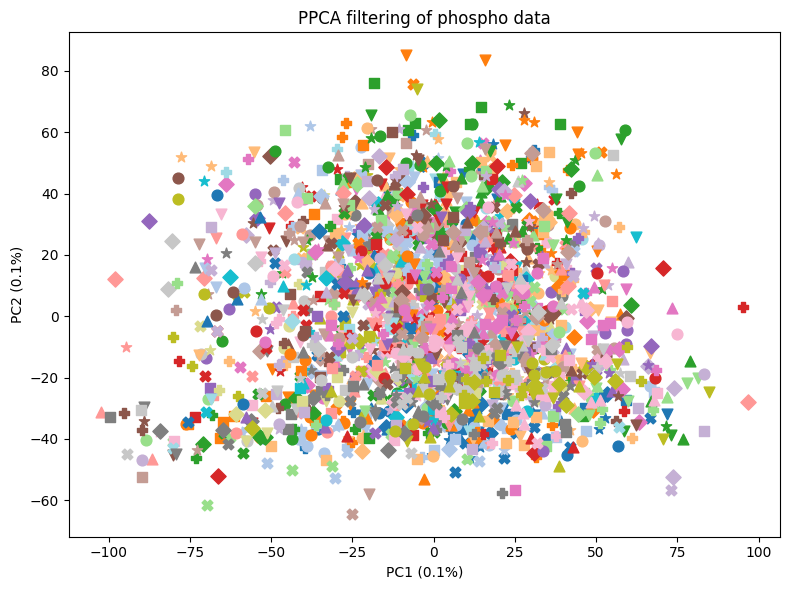

In [13]:
# PPCA  (2h to run with 0 occurrence threshold)
df = pp_after_summing
df = df.loc[:, ~df.columns.str.startswith('Identification')]
df = df.loc[:, ~df.columns.str.startswith('ref')]
df = filter_features_for_minimum_samples(df)
df.index = df.index.str.replace('pat_', '', regex=False)


# Define a palette and marker set
color_cycle = plt.cm.tab20.colors  # 20 colors
marker_cycle = ['o', 's', '^', 'D', 'v', 'P', 'X', '*']  # circle, square, triangle, etc.
style_combinations = list(itertools.product(color_cycle, marker_cycle))

batches = sample_annotation.loc[df.index, "Batch Name"]
unique_batches = batches.unique()
colors = {batch: plt.cm.tab10(i) for i, batch in enumerate(unique_batches)}
styles = {batch: style_combinations[i % len(style_combinations)]
          for i, batch in enumerate(unique_batches)}

model = PPCA()
model.fit(df.values, d=2)
pca_result = model.transform()
explained_variance = model.var_exp
explained_variance[1] = explained_variance[1] - explained_variance[0]

plt.figure(figsize=(8, 6))
for batch in unique_batches:
    idx = batches == batch
    color, marker = styles[batch]
    plt.scatter(
        pca_result[idx, 0], pca_result[idx, 1],
        label=batch, color=color, marker=marker, s=60
    )

plt.xlabel(f"PC1 ({explained_variance[0]:.1f}%)")
plt.ylabel(f"PC2 ({explained_variance[1]:.1f}%)")
plt.title("PPCA filtering of phospho data")
plt.tight_layout()

before filter (1998, 13069)
after filter (1998, 13069)


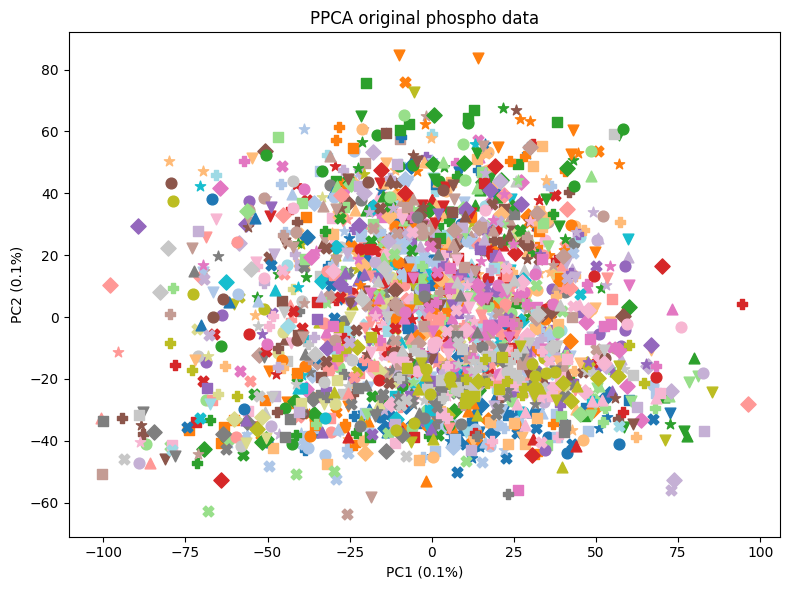

In [14]:
# PPCA 
df = pp_original
df = df.loc[:, ~df.columns.str.startswith('Identification')]
df = df.loc[:, ~df.columns.str.startswith('ref')]
df = filter_features_for_minimum_samples(df)
df.index = df.index.str.replace('pat_', '', regex=False)

model = PPCA()
model.fit(df.values, d=2)
pca_result = model.transform()
explained_variance = model.var_exp
explained_variance[1] = explained_variance[1] - explained_variance[0]

plt.figure(figsize=(8, 6))
for batch in unique_batches:
    idx = batches == batch
    color, marker = styles[batch]
    plt.scatter(
        pca_result[idx, 0], pca_result[idx, 1],
        label=batch, color=color, marker=marker, s=60
    )

plt.xlabel(f"PC1 ({explained_variance[0]:.1f}%)")
plt.ylabel(f"PC2 ({explained_variance[1]:.1f}%)")
plt.title("PPCA original phospho data")
plt.tight_layout()

before filter (1998, 13069)
after filter (1998, 13069)


/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


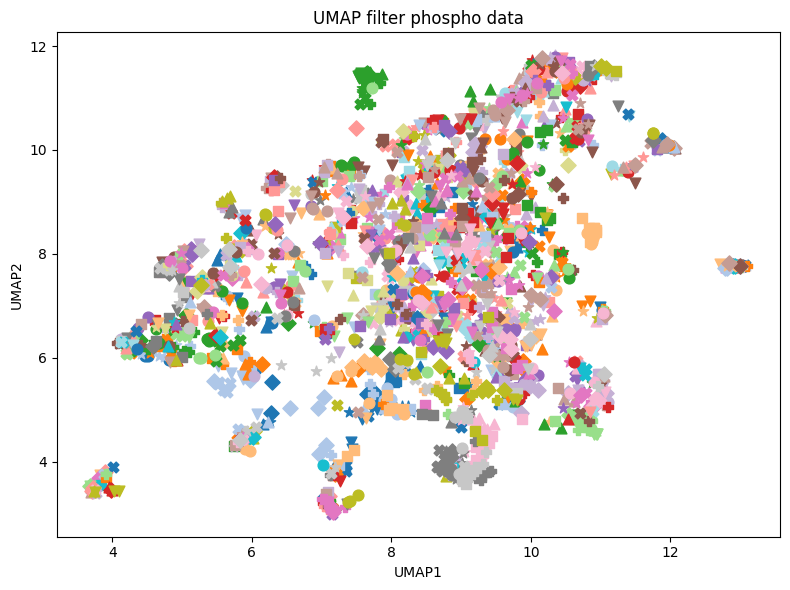

In [16]:
#  UMAP
df = pp_after_summing
df = df.loc[:, ~df.columns.str.startswith('Identification')]
df = df.loc[:, ~df.columns.str.startswith('ref')]
df = filter_features_for_minimum_samples(df)
df.index = df.index.str.replace('pat_', '', regex=False)

n_components_umap = 2
n_components_ppca = 2
n_epochs = 1000
n_neighbors = 10
metric = "euclidean"
random_state = 42

ppca = PPCA()
ppca.fit(data=df.values, d=n_components_ppca, verbose=False)
imputed_data = pd.DataFrame(ppca.data, index=df.index)

model = UMAP(
    n_components=n_components_umap,
    n_epochs=n_epochs,
    n_neighbors=n_neighbors,
    metric=metric,
    low_memory=True,
    random_state=random_state,
)
model.fit(imputed_data)
umap_result = model.transform(imputed_data)

plt.figure(figsize=(8, 6))
for batch in unique_batches:
    idx = batches == batch
    color, marker = styles[batch]
    plt.scatter(
        umap_result[idx, 0], umap_result[idx, 1],
        label=batch, color=color, marker=marker, s=60
    )
plt.xlabel(f"UMAP1")
plt.ylabel(f"UMAP2")
plt.title("UMAP filter phospho data")
plt.tight_layout()

before filter (1998, 13069)
after filter (1998, 13069)


/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/cjensen/.cache/pypoetry/virtualenvs/topas-pipeline-KWgSVD8J-py3.9/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


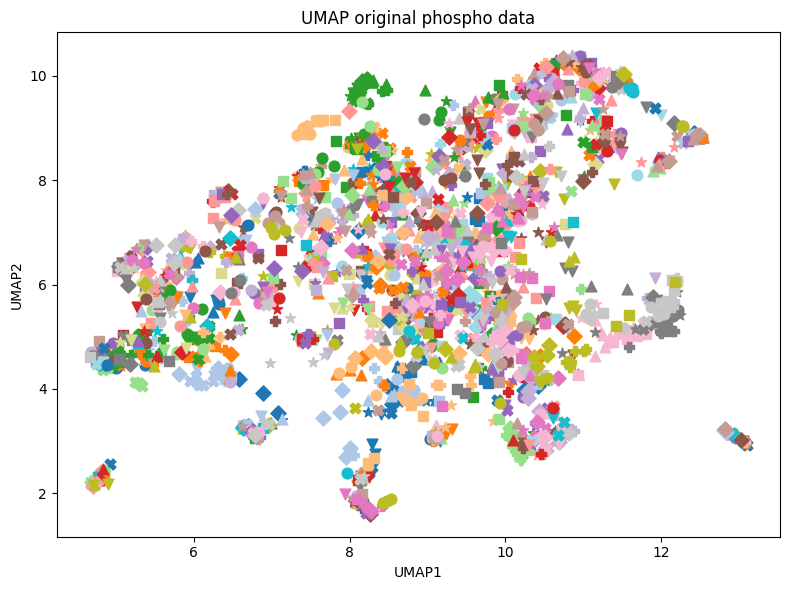

In [17]:
#  UMAP
df = pp_original
df = df.loc[:, ~df.columns.str.startswith('Identification')]
df = df.loc[:, ~df.columns.str.startswith('ref')]
df = filter_features_for_minimum_samples(df)
df.index = df.index.str.replace('pat_', '', regex=False)

ppca = PPCA()
ppca.fit(data=df.values, d=n_components_ppca, verbose=False)
imputed_data = pd.DataFrame(ppca.data, index=df.index)

model = UMAP(
    n_components=n_components_umap,
    n_epochs=n_epochs,
    n_neighbors=n_neighbors,
    metric=metric,
    low_memory=True,
    random_state=random_state,
)
model.fit(imputed_data)
umap_result = model.transform(imputed_data)

plt.figure(figsize=(8, 6))
for batch in unique_batches:
    idx = batches == batch
    color, marker = styles[batch]
    plt.scatter(
        umap_result[idx, 0], umap_result[idx, 1],
        label=batch, color=color, marker=marker, s=60
    )

plt.xlabel(f"UMAP1")
plt.ylabel(f"UMAP2")
plt.title("UMAP original phospho data")
plt.tight_layout()

In [ ]:
# OBS maybe try comparison somehow where i load one column from the file at a time

# after grouping seems wrong because preprocessed_fp2.csv is bigger than original.. 
# cannot say for sure but also correlations are ALL 1
# before grouping was run incorrectly so it is being rerun..

In [2]:
# Load the data of fp removal before grouping

results_folder = Path('/media/kusterlab/internal_projects/active/TOPAS/WP31/Playground/Retrospective_study/2025.08.14_CJ_paper_cohort_robust_zscore_and_dr_filter')
results_folder_original = Path('/media/kusterlab/internal_projects/active/TOPAS/WP31/Playground/Retrospective_study/2025.08.06_CJ_paper_cohort_topas_v7_corrected_metadata')

fp_before_grouping = pd.read_csv(results_folder / 'preprocessed_fp.csv', index_col='Gene names')
# fp_after_grouping = pd.read_csv(results_folder / 'filter_at_protein_level' / 'preprocessed_fp.csv', index_col='Gene names')  
fp_original = pd.read_csv(results_folder_original / 'preprocessed_fp.csv', index_col='Gene names')

# Remove columns starting with Identification
fp_before_grouping = fp_before_grouping.loc[:, ~fp_before_grouping.columns.str.startswith('Identification')]
# fp_after_grouping = fp_after_grouping.loc[:, ~fp_after_grouping.columns.str.startswith('Identification')]
fp_original = fp_original.loc[:, ~fp_original.columns.str.startswith('Identification')]

/tmp/ipykernel_213370/1766724881.py:6: DtypeWarning: Columns (2688,2689,2690,2691,2692,2771,2772,2773,2774,2775,2776,2777,2778,2779,2780,2781,2782,2783,2804,2805,2806,2807,2808,2809,2810,2917,2918,2919,2986,2987,2988,2989,2990,2991,3024,3025,3026,3027,3028,3029,3100,3101,3102,3103,3104,3185,3186,3187,3188,3189,3190,3197,3198,3199,3200,3201,3202,3203,3204,3255,3256,3257,3258,3259,3260,3261,3356,3357,3358,3359,3360,3555,3556,3557,3558,3559,3560,3561,3562,3563,3564,3565,3598,3599,3600,3601,3602,3603,3604,3705,3706,3707,3708,3709,3710,3711,3712,3713,3723,3724,3725,3726,3727,3728,3729,3730,3731,3818,3819,3820,3821,3822,3823,3824,3825,3835,3836,3837,3838,3839,3840,3841,3862,3863,3864,3865,3866,3867,3868,3869,3992,3993,3994,3995,3996,3997,3998,3999,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4034,4035,4036,4037,4038,4039,4040,4041,4218,4219,4220,4221,4222,4223,4224,4225,4273,4274,4275,4276,4277,4278,4279,4297,4298,429

In [4]:
# Sanity checks
print(fp_before_grouping.shape)
# print(fp_after_grouping.shape)
print(fp_original.shape)
# Sparsity of dfs
print(fp_before_grouping.isna().sum().sum())  # it was wrong!!!
# print(fp_after_grouping.isna().sum().sum())   # Different but we expect this (much larger)
print(fp_original.isna().sum().sum())  # Not different but we also kind of expect this

(13069, 2586)
(13069, 2586)
12220168
12220168


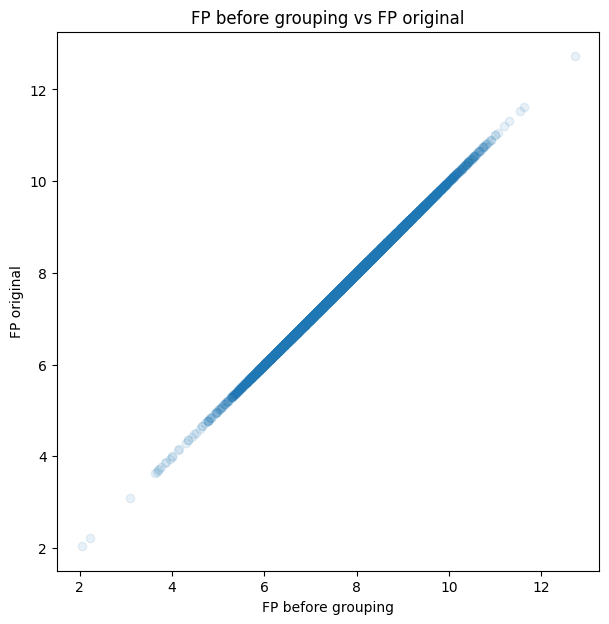

In [7]:
# Compare correlations between the different dataframes
correlation_after_original = fp_before_grouping.corrwith(fp_original, axis=0)
correlation_after_original

# is there a non 1 anywhere in the corr



# # scatter plot of before and after grouping
plt.figure(figsize=(7, 7))
plt.scatter(fp_before_grouping.loc[:, 'pat_K26K-DUL4HS-M22-Q1'], fp_original.loc[:, 'pat_K26K-DUL4HS-M22-Q1'], alpha=0.1)
plt.xlabel('FP before grouping')
plt.ylabel('FP original')
plt.title('FP before grouping vs FP original')
plt.show()


In [6]:
test = pd.concat([fp_before_grouping.loc[:, 'pat_K26K-DUL4HS-M22-Q1'], fp_original.loc[:, 'pat_K26K-DUL4HS-M22-Q1']], axis=1)
# test.iloc[:, 0] == test.iloc[:, 1]  # This should be true for all rows if they are the same

# # # take subset where False of test.iloc[:, 0] == test.iloc[:, 1]
test_false = test[test.iloc[:, 0] != test.iloc[:, 1]]
test_false

# # test.loc['CYP11B1', :]


,pat_K26K-DUL4HS-M22-Q1,pat_K26K-DUL4HS-M22-Q1
Gene names,,
OBSCN,NaN,NaN
CEACAM5,NaN,NaN
MYH1,NaN,NaN
STAB2,NaN,NaN
LAMA3,NaN,NaN
...,...,...
CSF3R,NaN,NaN
MSANTD3,NaN,NaN
SLITRK3,NaN,NaN
